<div align="center">
    <h1>Multi-Layer Perceptrons: Part 1</h1>
    <h3>Breaking Through Linear Limitations with the Spiral Dataset</h3>
    <hr>
</div>

## Learning Objectives

Welcome to the world of **neural networks**! In this assignment, you'll implement and explore Multi-Layer Perceptrons (MLPs) using the challenging spiral dataset - a perfect showcase for why we need non-linear models. By the end of this notebook, you will:

- Understand why linear classifiers fail on spiral patterns and how MLPs solve this problem
- Implement a two-hidden-layer neural network from scratch
- Explore how different activation functions shape decision boundaries
- See firsthand how neural networks can learn complex, spiraling patterns
- Build intuition for deeper architectures used in state-of-the-art models

## From Linear to Non-Linear: The Spiral Challenge

### Why Linear Classifiers Fail on Spirals

The spiral dataset is the perfect demonstration of linear classifier limitations:

| **Linear Classifier** | **Multi-Layer Perceptron** |
|---|---|
| Can only learn straight decision boundaries | Can learn curved, spiraling boundaries |
| Would achieve ~33% accuracy (random guessing) | Can achieve near-perfect separation |
| Cannot capture rotating patterns | Naturally handles complex curves |
| Fails completely on intertwined classes | Learns to "unwrap" the spirals |

### The Power of Depth and Non-Linearity

MLPs overcome these limitations through two key innovations:
1. **Multiple layers**: Stack linear transformations to build complex functions
2. **Activation functions**: Introduce non-linearity between layers

Without activation functions, stacking linear layers would still give us just a linear model - which would fail miserably on spirals! The non-linearity is what enables neural networks to trace the spiraling decision boundaries.

## The Architecture We'll Build

Our MLP has the following structure:
```
Input (2D) → Linear → Activation → Linear → Activation → Linear → Output (3 classes)
           (100 hidden)           (2 hidden)
```

The second hidden layer has only 2 neurons, allowing us to visualize the learned representations in 2D space - you'll see how the network "untwists" the spirals!

In [1]:
import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'

%load_ext autoreload
%autoreload 2

In [ ]:
import os
import torch
import numpy as np

from utils import Data2DVisualizer, dataset_stats

notebook_dir = os.getcwd()
dataset_path = os.path.join(notebook_dir, 'data', 'datasets', 'spirals.npz')

# Load the dataset
dataset = np.load(dataset_path)

X_train = torch.from_numpy(dataset['X_train']).float()
y_train = torch.from_numpy(dataset['y_train']).long()

X_val = torch.from_numpy(dataset['X_val']).float()
y_val = torch.from_numpy(dataset['y_val']).long()

X_test = torch.from_numpy(dataset['X_test']).float()
y_test = torch.from_numpy(dataset['y_test']).long()

vis = Data2DVisualizer((X_train, y_train), (X_val, y_val), (X_test, y_test))
vis.show_dataset()

num_features, num_classes, num_samples = dataset_stats(X_train, y_train, X_val, y_val, X_test, y_test, verbose=True)

## The Dataset: Spiral Pattern

### Why the Spiral Dataset?

The spiral dataset is a classic benchmark for testing non-linear classifiers because:

1. **Impossible for linear classifiers**: No straight lines can separate the spiraling classes
2. **Perfect for MLPs**: Demonstrates the power of non-linear decision boundaries
3. **Visual clarity**: The spiral pattern makes it obvious when the network succeeds
4. **Complexity gradient**: Tests the network's ability to learn curved, intertwining patterns

### What Makes Spirals Challenging?

- **Non-linear separability**: Classes spiral around each other in a complex pattern
- **No simple decision boundary**: Requires the network to learn curved, intricate boundaries
- **Tests network capacity**: Too simple a network cannot capture the spiral structure
- **Clear success metric**: You can visually see if the network has learned the pattern

Let's load the data and see the beautiful spiral structure we're working with:

## Implementation Tasks

### Your Assignment: Building the MLP

Before running the training cells below, you need to implement four key methods in `src/assignments/mlp_classifier.py`. This builds directly on your linear classifier implementation, but now with multiple layers!

### Assignment 4.1: Forward Pass (`forward` method)
**What to implement**: Compute logits through multiple layers with activation functions

**The architecture**:
1. First layer: `X @ W1 + b1` → activation function
2. Second layer: `hidden1 @ W2 + b2` → activation function  
3. Output layer: `hidden2 @ W3 + b3` (no activation here!)

**Key considerations**:
- Apply the activation function after each hidden layer (not the output!)
- The activation function is stored in `self.activation_func`
- Think about the flow of data through the network

### Assignment 4.2: Prediction (`predict` method)
**What to implement**: Convert logits to predicted class labels
- This is identical to the linear classifier!
- Use the forward method to get logits
- Return the class with the highest score

### Assignment 4.3: Loss Function (`loss` method)
**What to implement**: Cross-entropy loss with L2 regularization
- Same loss as the linear classifier
- But now regularize ALL weight matrices (W1, W2, W3)
- Don't forget: more parameters means regularization is even more important!

### Assignment 4.4: Weight Updates (`_update_weights` method)
**What to implement**: Gradient descent for all parameters
- Update all six parameters: W1, b1, W2, b2, W3, b3
- Same gradient descent formula as before
- Use `torch.no_grad()` context to avoid affecting the computation graph

### Understanding the Code Structure

The provided code already:
- Initializes all weight matrices with appropriate dimensions
- Sets up the activation function based on the string parameter
- Handles the training loop and validation

Your job is to connect these pieces with the forward pass and optimization logic!

### Tips for Success

1. **Test dimensions**: Print shapes frequently - dimension mismatches are common
2. **Start simple**: Get forward pass working before worrying about training
3. **Activation placement**: Remember - no activation after the final layer!
4. **Gradient flow**: Ensure all parameters have gradients before updating

### Materials and Resources

Before implementing, **read the provided materials**: [MLP Materials](https://urob-ctu.github.io/docs/docs/classification/mlp.html)

In [3]:
# Define the dimensions of the hidden layers
hidden_dim_1 = 100
hidden_dim_2 = 2

## Network Architecture

### Hidden Layer Dimensions

We're using a specific architecture for educational purposes:
- **First hidden layer**: 100 neurons - provides sufficient capacity for learning
- **Second hidden layer**: 2 neurons - enables 2D visualization of learned features

This bottleneck architecture forces the network to compress information into 2D, letting us see what it learns!

## Activation Functions Comparison

### ReLU Activation Function

**Rectified Linear Unit (ReLU)**: `f(x) = max(0, x)`

ReLU is the most popular activation function in modern deep learning because:
- **Simple**: Just outputs 0 for negative inputs, passes positive inputs unchanged
- **Fast**: No expensive operations like exponentials
- **Avoids vanishing gradients**: Gradient is either 0 or 1
- **Sparse activations**: Many neurons output exactly 0

**Potential issues**:
- **Dead neurons**: If a neuron outputs 0, it might never recover
- **Not zero-centered**: Can slow down gradient descent
- **Unbounded**: Output can grow arbitrarily large

Let's see how ReLU performs on our dataset:

Training: 100%|████████████████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 529.25it/s]


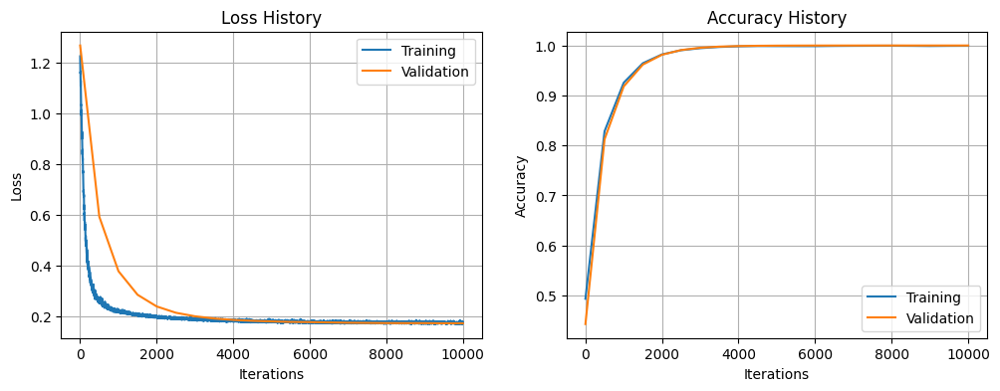

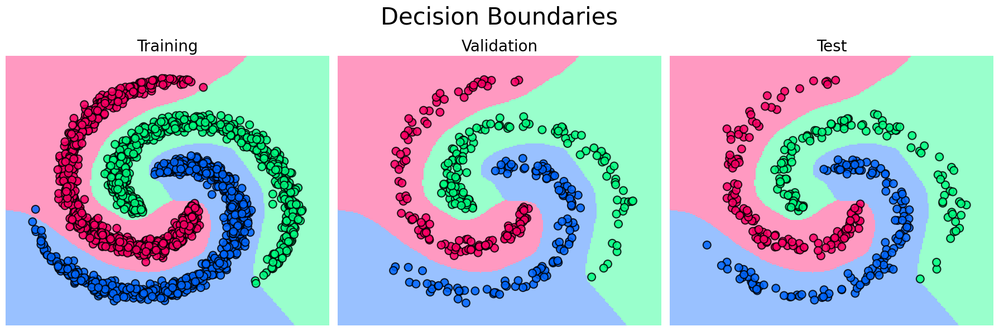

In [4]:
import torch

from utils import plot_training
from assignments.mlp_classifier import MLPClassifier

torch.random.manual_seed(69)

# Train the MLP with ReLU activation function
mlp_relu = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-3,
                         learning_rate=0.1, 
                         batch_size=200, 
                         num_iters=10000)
relu_loss_history, relu_acc_history = mlp_relu.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(relu_loss_history, relu_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_relu, h=0.01)

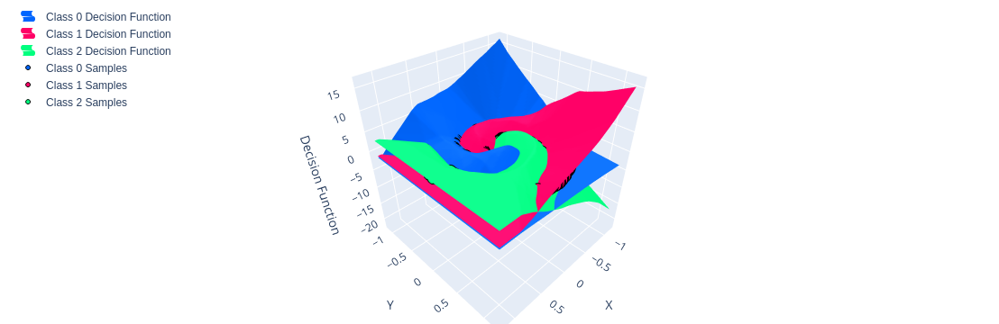

In [7]:
vis.show_decision_functions(mlp_relu)

### Analyzing ReLU Results

Notice how the decision boundaries with ReLU:
- **Follow the spiral pattern**: The network learns to trace along the spiraling classes
- **Piecewise linear approximation**: ReLU approximates the smooth spirals with many linear segments
- **Sharp but effective**: Despite being composed of straight pieces, it captures the curved pattern

The decision functions show how the network builds confidence regions that spiral outward.

### Hyperbolic Tangent (Tanh) Activation Function

**Tanh**: `f(x) = (e^x - e^(-x)) / (e^x + e^(-x))`

Tanh was popular before ReLU because:
- **Zero-centered**: Outputs range from -1 to 1, mean closer to 0
- **Smooth**: Differentiable everywhere
- **Bounded**: Output always between -1 and 1

**Potential issues**:
- **Vanishing gradients**: Saturates for large positive/negative inputs
- **Computationally expensive**: Requires exponential calculations
- **Slower convergence**: Especially in deep networks

Notice we're using more iterations (20,000) - tanh often needs more training!

Training: 100%|████████████████████████████████████████████████████████████████| 20000/20000 [00:32<00:00, 608.22it/s]


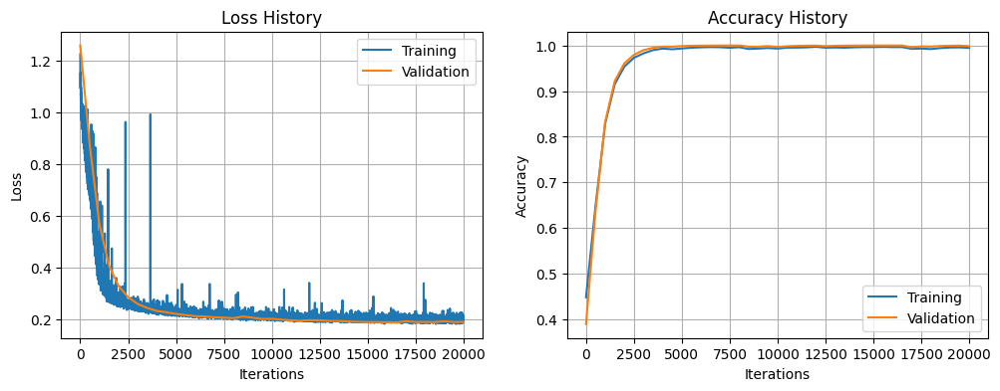

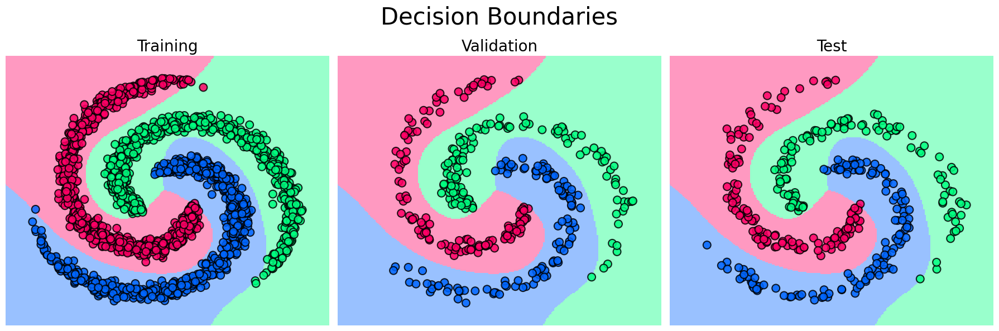

In [5]:
import torch

from utils import plot_training
from assignments import MLPClassifier

torch.random.manual_seed(69)

# Train the MLP with Hyperbolic Tangent as an activation function
mlp_tanh = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-3,
                         learning_rate=1e-1, 
                         batch_size=100, 
                         num_iters=20000, 
                         activation='tanh')
tanh_loss_history, tanh_acc_history = mlp_tanh.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(tanh_loss_history, tanh_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_tanh, h=0.01)

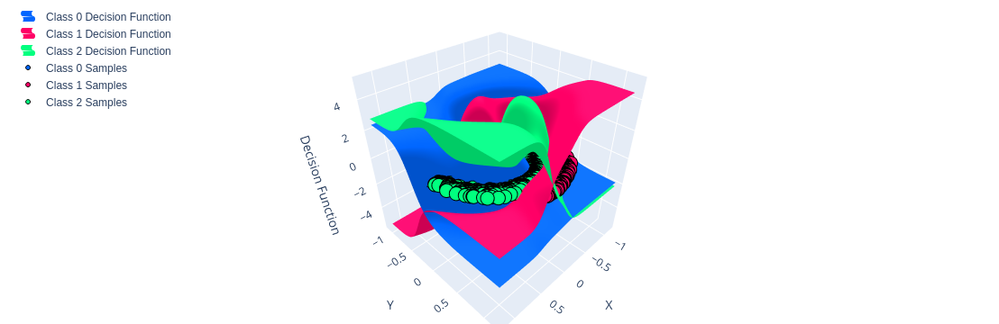

In [6]:
vis.show_decision_functions(mlp_tanh)

### Analyzing Tanh Results

Compare with ReLU:
- **Smoother spiral boundaries**: Tanh creates more naturally curved boundaries that better match the spiral geometry
- **Continuous curves**: Better suited for the smooth, rotating nature of the spiral pattern
- **More iterations needed**: The smooth gradients require more training to fully capture the spirals

### Sigmoid Activation Function

**Sigmoid**: `f(x) = 1 / (1 + e^(-x))`

The classic activation function from early neural networks:
- **Probabilistic interpretation**: Output between 0 and 1, like probabilities
- **Smooth gradient**: Differentiable everywhere
- **Historical significance**: Used in original backpropagation papers

**Why it's rarely used today**:
- **Severe vanishing gradients**: Gradient nearly 0 for most inputs
- **Not zero-centered**: Outputs always positive
- **Slow learning**: Especially problematic in deep networks

Notice we need:
- Very low regularization (1e-6)
- Many iterations (30,000)
- Smaller batch size (50)

This demonstrates why sigmoid has fallen out of favor!

Training: 100%|████████████████████████████████████████████████████████████████| 30000/30000 [00:49<00:00, 607.30it/s]


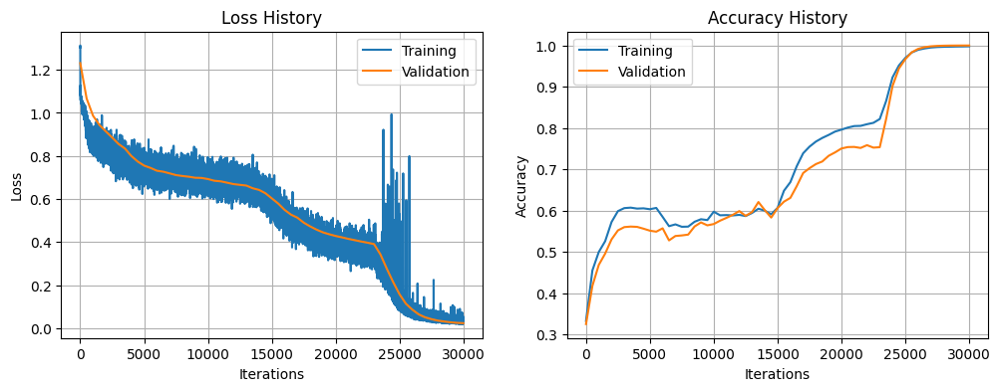

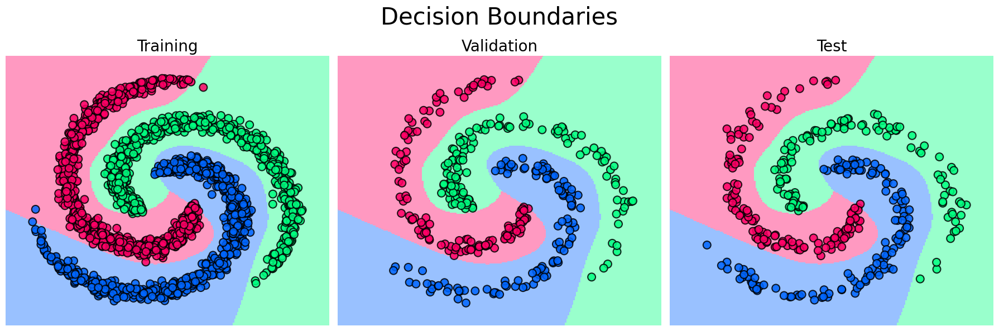

In [8]:
import torch

from utils import plot_training
from assignments import MLPClassifier

torch.random.manual_seed(69)

# Train the MLP with Sigmoid as an activation function
mlp_sigmoid = MLPClassifier(num_features, 
                         hidden_dim_1, 
                         hidden_dim_2, 
                         num_classes, 
                         reg=1e-6,
                         learning_rate=1e-1, 
                         batch_size=50, 
                         num_iters=30000, 
                         activation='sigmoid')

sigmoid_loss_history, sigmoid_acc_history = mlp_sigmoid.train(X_train, y_train, X_val, y_val)

# Plot the training loss and accuracy and visualize the decision boundaries
plot_training(sigmoid_loss_history, sigmoid_acc_history, ema=True, alpha=0.5)
vis.show_decision_boundaries(mlp_sigmoid, h=0.01)

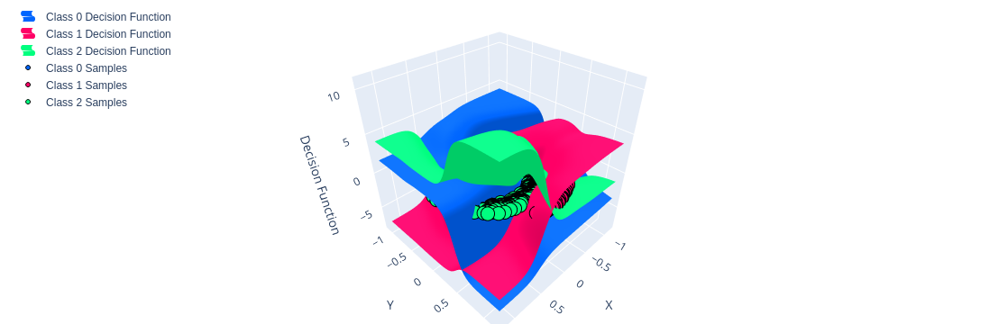

In [9]:
vis.show_decision_functions(mlp_sigmoid)

### Analyzing Sigmoid Results

Observe the differences:
- **Struggles with spirals**: The vanishing gradients make it hard to learn the complex spiral pattern
- **Incomplete separation**: May not fully separate all three spiraling classes even after many iterations
- **Historical perspective**: Shows why sigmoid is inadequate for complex non-linear patterns like spirals

## Summary and Key Takeaways

### Activation Function Comparison on Spirals

| **Activation** | **Training Speed** | **Spiral Boundary Quality** | **Gradient Flow** | **Best For Spirals** |
|---|---|---|---|---|
| ReLU | Fast | Piecewise approximation | Good (except dead neurons) | Yes - efficient |
| Tanh | Moderate | Smooth, natural curves | Vanishes at extremes | Yes - aesthetic |
| Sigmoid | Very slow | Often incomplete | Severe vanishing | No - struggles |

### What You've Learned

1. **Spirals need non-linearity**: Linear classifiers completely fail on spiral patterns
2. **MLPs can learn complex patterns**: With proper activation functions, they trace spiraling boundaries
3. **Architecture matters**: The 2-hidden-layer design successfully "untwists" the spirals
4. **ReLU vs Tanh trade-off**: ReLU trains faster, Tanh gives smoother spiral boundaries

### Reflection Questions

1. Why is the spiral dataset impossible for linear classifiers but solvable by MLPs?
2. How does the network learn to separate the intertwined spiral arms?
3. What would happen if you increased or decreased the number of hidden neurons?
4. Could a single hidden layer solve the spiral problem? Why or why not?

### The Power of Visualization

The spiral dataset beautifully demonstrates:
- How neural networks transform data through layers
- The importance of non-linear activation functions
- The difference between linear and non-linear decision boundaries
- Why deep learning revolutionized pattern recognition

### Next Steps

In Part 2, you'll apply MLPs to CIFAR-10 and explore:
- How these same principles scale to high-dimensional image data
- The challenge of optimizing networks on real-world problems
- The critical importance of hyperparameter tuning